In [1]:
import os
import sys
import numpy as np
import pandas as pd
import cv2
import re
import matplotlib.pyplot as plt
from matplotlib import animation
import matplotlib as mpl
import skimage
from scipy.ndimage import gaussian_filter
from PIL import Image, ExifTags
import exifread
import imageio
from datetime import timedelta
import pickle
from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
from modules import processing
import scipy.fft
from sklearn.ensemble import RandomForestClassifier
from functools import partial
from minisom import MiniSom
import json
from datetime import datetime

In [2]:
sys.path.append('./modules')
from run_handler import Campaign

In [3]:
campaign = Campaign('./configs/TestCampaign01.json')

In [4]:
campaign.runs[0].image_files

['Y:\\Cathode\\LocalHVTest\\SpareMesh\\spareMesh_NIKON\\Test1\\DSC_1957.JPG',
 'Y:\\Cathode\\LocalHVTest\\SpareMesh\\spareMesh_NIKON\\Test1\\DSC_1958.JPG',
 'Y:\\Cathode\\LocalHVTest\\SpareMesh\\spareMesh_NIKON\\Test1\\DSC_1959.JPG']

In [2]:
_PATH = 'C:\\Users\\tm3408\\Desktop\\phd\\workspace\\data\\hv_mesh_test'
test_run = 1
if test_run == 1:
    PATH_TO_IMAGES = 'Y:\\Cathode\\LocalHVTest\\SpareMesh\\spareMesh_NIKON'
    PATH_TO_DATA = os.path.join(_PATH, 'hv_output', 'test_04_24')
    PATH_TO_DICTS = os.path.join(_PATH, 'data', 'test_04_24')
    all_image_files = [f.path for f in os.scandir(os.path.join(_PATH, 'images')) if f.path.endswith('JPG')]
elif test_run == 2:
    PATH_TO_IMAGES = 'Y:\\Cathode\\LocalHVTest\\SpareMesh_2nd_230502\\NIKON'
    PATH_TO_DATA = os.path.join(_PATH, 'hv_output', 'test_05_02')
    PATH_TO_DICTS = os.path.join(_PATH, 'data', 'test_05_02')
    all_image_files = []
    for path, subdirs, files in os.walk(PATH_TO_IMAGES):
        for subdir in subdirs:
            all_image_files.extend([f.path for f in os.scandir(os.path.join(path, subdir)) if f.path.endswith('JPG')])

all_data_files = [f.path for f in os.scandir(PATH_TO_DATA) if f.path.endswith('.csv')]

# Sort images to time

In [6]:
def get_cluster_contours(img, binary_threshold=50):
    _, binary = cv2.threshold(img, binary_threshold, 255, cv2.THRESH_BINARY)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, np.ones((20, 20), np.uint8))
    binary = np.uint8(binary)
    contours, _ = cv2.findContours(image=binary, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
    return contours

def get_contour_pixels(img, contour):
    mask = np.zeros_like(img)
    cv2.drawContours(mask, [contour], 0, color=1, thickness=-1)
    pixels = img[np.where(mask==1)]
    return pixels

def get_contour_values(img, contour):
    perimeter = cv2.arcLength(contour, True)
    pixels = get_contour_pixels(img, contour)
    area = len(pixels)
    mass = sum(pixels)
    return mass, area, perimeter

31


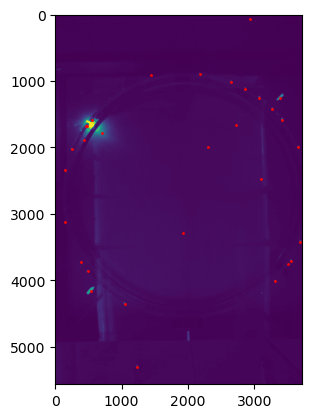

In [7]:
test_img = cv2.imread(all_image_files[43], cv2.IMREAD_GRAYSCALE)
contours = get_cluster_contours(test_img, binary_threshold=50)
print(len(contours))
plt.imshow(test_img)
x = [np.mean(c[:,:,0]) for c in contours]
y = [np.mean(c[:,:,1]) for c in contours]
plt.plot(x, y, 'o', color='red', markersize=1)
plt.show()

In [8]:
IMAGE_DT = timedelta(minutes=2, seconds=51)
def get_time_from_img(file):
    '''
    Image time has an offset! See calibration image.
    Real time = 13:29:20
    Tag time  = 13:32:11
    '''
    with open(file, 'rb') as f:
        tags = exifread.process_file(f, stop_tag="EXIF DateTimeOriginal")
        time = pd.to_datetime(str(tags['EXIF DateTimeOriginal']), format='%Y:%m:%d %H:%M:%S') - IMAGE_DT
    return time

class MeasurmentCampaign:
    def __init__(self, file: str, dict_file=None) -> None:
        self.file = file
        year, month, day = self.extract_date()
        # Assuming these stay the same
        column_headers = ['time', 'set_voltage', 'voltage', 'ramp', 'current', 'current_cap', 'warn', 'error']
        self.data = pd.read_csv(self.file, delimiter='\t;', names=column_headers, usecols=[*range(8)], engine='python')
        self.data['time'] = f'{year}-{month}-{day} ' + self.data['time'].astype(str)
        self.data['time'] = pd.to_datetime(self.data['time'])
        self.start_time = min(self.data['time'])
        self.end_time = max(self.data['time'])
        self.image_files = []
        if dict_file is None:
            self.image_data = {'id': [], 'path': [], 'time': [], 'exposure': [], 'n_clusters': [], 'masses': [], 'areas': [], 'perimeters': [], 'cluster_positions': []}
        else:
            with open(dict_file, 'rb') as f:
                self.image_data = pickle.load(f)

    def extract_date(self) -> tuple:
        date = re.match('.*(\d{2})\.(\d{2})\.(\d{4})\.csv', self.file.split(os.path.sep)[-1])
        if len(date.groups()) == 3:
            return date.group(3), date.group(2), date.group(1)
        raise ValueError(f'Could not extract date from filename {self.file}.\nGot {date} as matching regex.')

    def get_image_files(self, directory: str) -> None:
        '''
        Collects image files from a given directory,
        that were taken between start_time and end_time.
        '''
        self.image_files = []
        files = [f.path for f in os.scandir(directory) if f.path.endswith('JPG')]
        count = 0
        for file in files:
            time = get_time_from_img(file=file)
            if self.start_time < time < self.end_time:
                self.image_files.append(file)
                with open(file, 'rb') as f:
                    tags = exifread.process_file(f, stop_tag="EXIF ExposureTime")
                exp_time = float(eval(str(tags['EXIF ExposureTime'])))
                if count not in self.image_data['id']:
                    self.image_data['id'].append(count)
                    self.image_data['path'].append(file)
                    self.image_data['time'].append(time)
                    self.image_data['exposure'].append(exp_time)
                count += 1

    def get_processed_image(self, f, gauss_sigma=3, contrast_clip=2, contrast_grid_size=(50, 50)):
        img = cv2.imread(f, cv2.IMREAD_COLOR)[:,:,::-1]
        img = filter_circle(img) #filter_green_arrows(img)
        img = gaussian_filter(img, sigma=gauss_sigma)
        img = processing.increase_contrast(img.astype(np.uint8), clip_limit=contrast_clip, tile_grid_size=contrast_grid_size)
        img = cv2.cvtColor(processing.increase_brightness(img, value=0), cv2.COLOR_RGB2GRAY)
        return img


    def plot_image(self, idx: int) -> tuple:
        fig, ax = plt.subplots(1, 1)
        ax.imshow(cv2.imread(self.image_files[idx], cv2.IMREAD_COLOR)[:,:,::-1])
        return fig, ax 
    
    def calculate_image_data(self, binary_threshold=50) -> None:
        for img_id, f in enumerate(self.image_data['path']):
            img = self.get_processed_image(f)
            contours = get_cluster_contours(img=img, binary_threshold=binary_threshold)
            self.image_data['n_clusters'].append(len(contours))
            masses = []
            areas = []
            perimeters = []
            positions = []
            for contour_id, contour in enumerate(contours):
                mass, area, perimeter = get_contour_values(img, contour)
                masses.append(mass)
                areas.append(area)
                perimeters.append(perimeter)
                positions.append((np.mean(contour[:,:,0]), np.mean(contour[:,:,1])))
            self.image_data['masses'].append(masses)
            self.image_data['areas'].append(areas)
            self.image_data['perimeters'].append(perimeters)
            self.image_data['cluster_positions'].append(positions)
        
    def save_image_data(self, file):
        with open(file, 'wb') as f:
            pickle.dump(self.image_data, f)

In [36]:
tm0 = MeasurmentCampaign(all_data_files[1])
print(f'{tm0.start_time} - {tm0.end_time}')
tm0.get_image_files(os.path.join(PATH_TO_IMAGES, 'Test2'))
print(len(tm0.image_files))

2023-05-02 23:14:41 - 2023-05-02 23:37:53
70


# find clusters

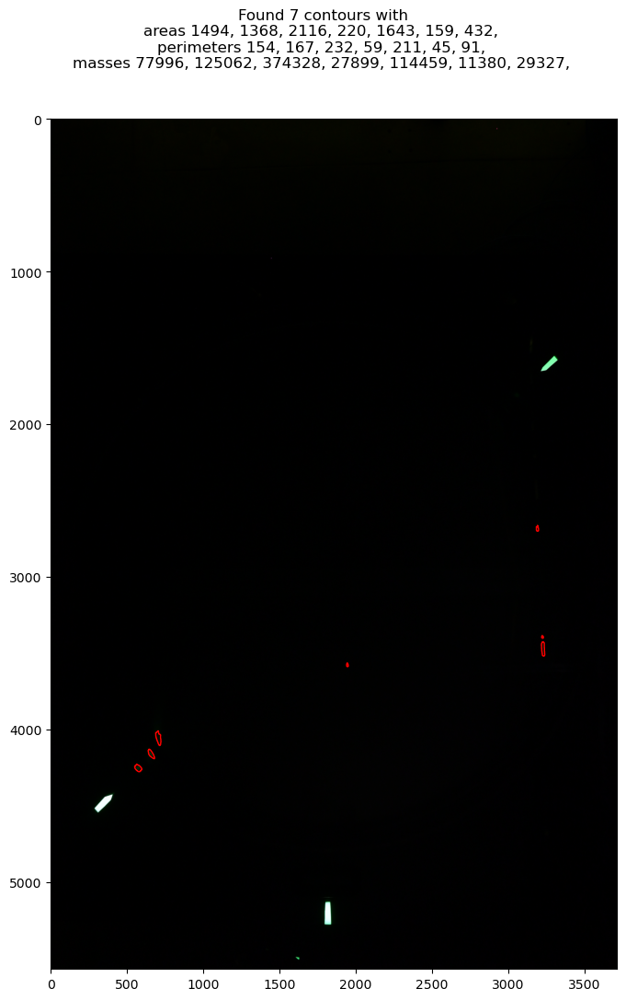

In [37]:
img_id = 0
img = tm0.get_processed_image(tm0.image_files[img_id])
cluster_contours = get_cluster_contours(img, binary_threshold=10)
fig, ax = tm0.plot_image(img_id)
area_string = ''
mass_string = ''
perimeter_string = ''
for c in cluster_contours:
    ax.plot(c[:,:,0], c[:,:,1], color='red', lw=1)
    mass, area, perimeter = get_contour_values(test_img, c)
    area_string += f'{area :.0f}, '
    mass_string += f'{mass :.0f}, '
    perimeter_string += f'{perimeter :.0f}, '
fig.suptitle(f'Found {len(cluster_contours)} contours with\nareas {area_string}\nperimeters {perimeter_string}\nmasses {mass_string}')
fig.set_size_inches(9, 12)
plt.show()

# clusters per time/voltage/current/...

In [9]:
force_calculate = False
if force_calculate:
    test_measurements = [MeasurmentCampaign(f) for i, f in enumerate(all_data_files)]
else:
    test_measurements = [MeasurmentCampaign(f, dict_file=os.path.join(PATH_TO_DICTS, f'measurement_{i}_image_data.pkl')) for i, f in enumerate(all_data_files)]
for i, tm in enumerate(test_measurements):
    print(i)
    tm.get_image_files(os.path.join(PATH_TO_IMAGES, f'Test{i+1}'))
    if force_calculate:
        tm.calculate_image_data(binary_threshold=10)
        tm.save_image_data(os.path.join(PATH_TO_DICTS, f'measurement_{i}_image_data.pkl'))

0
1
2
3


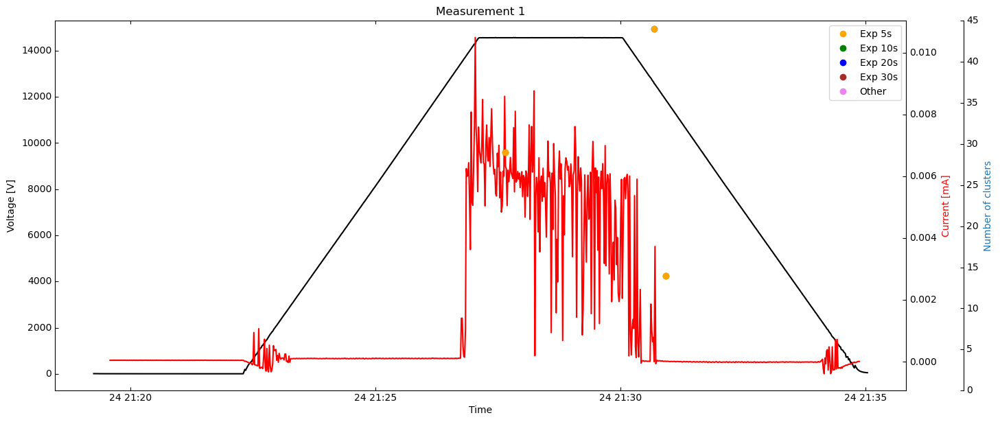

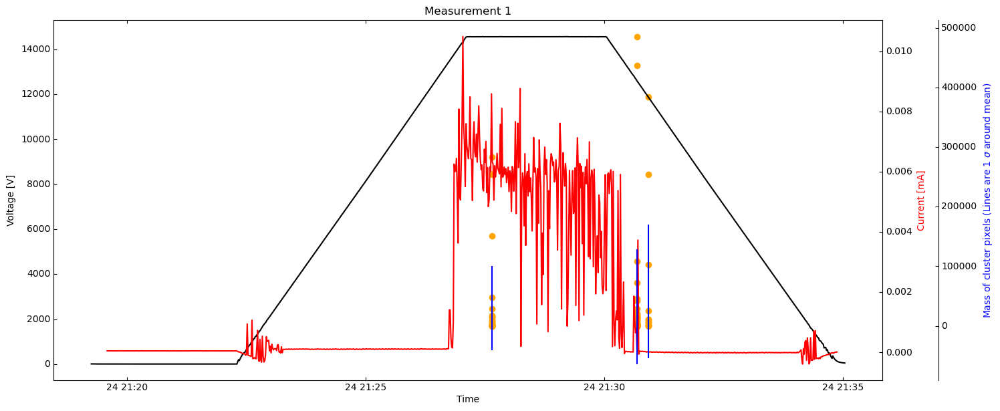

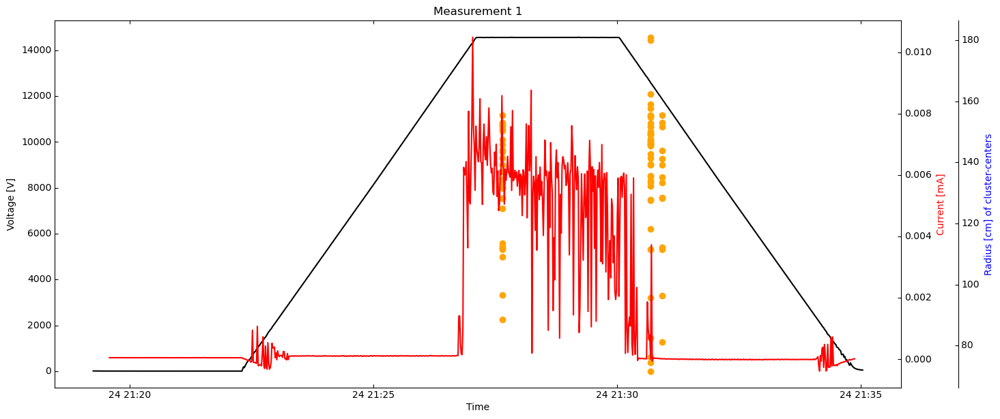

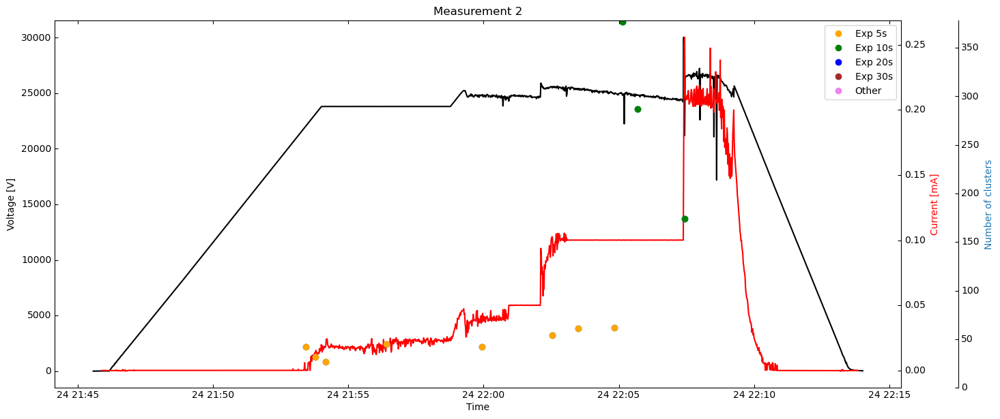

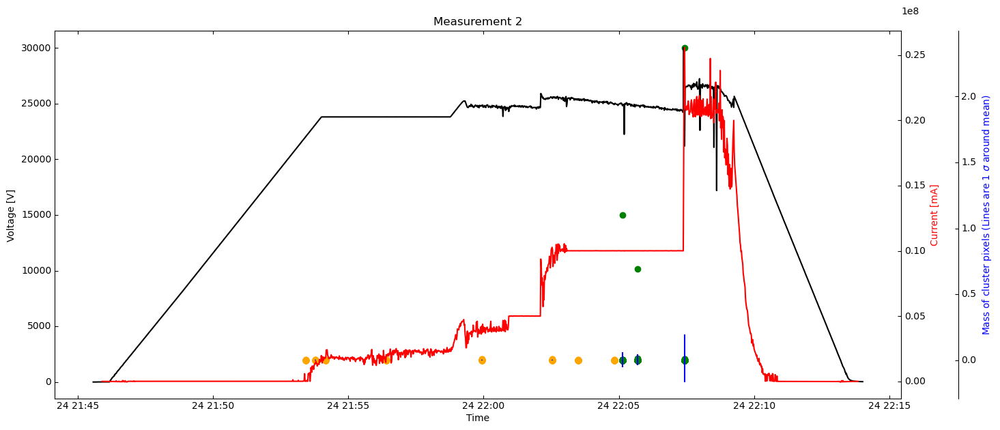

...

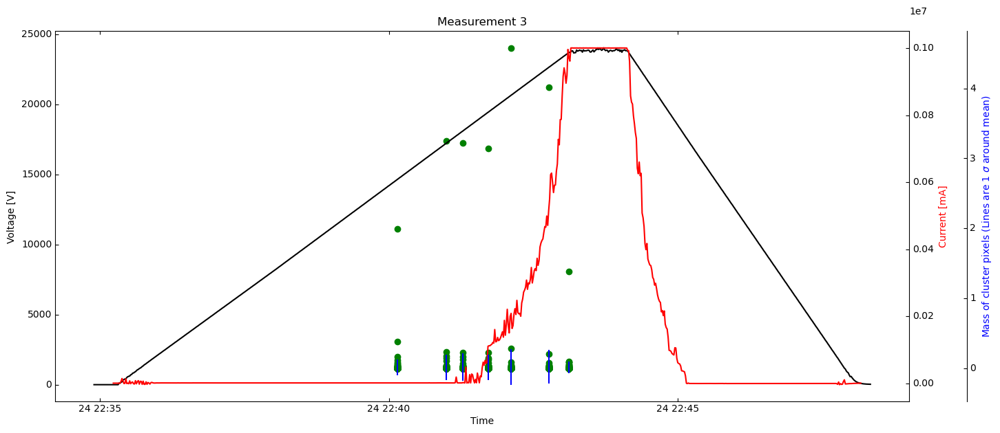

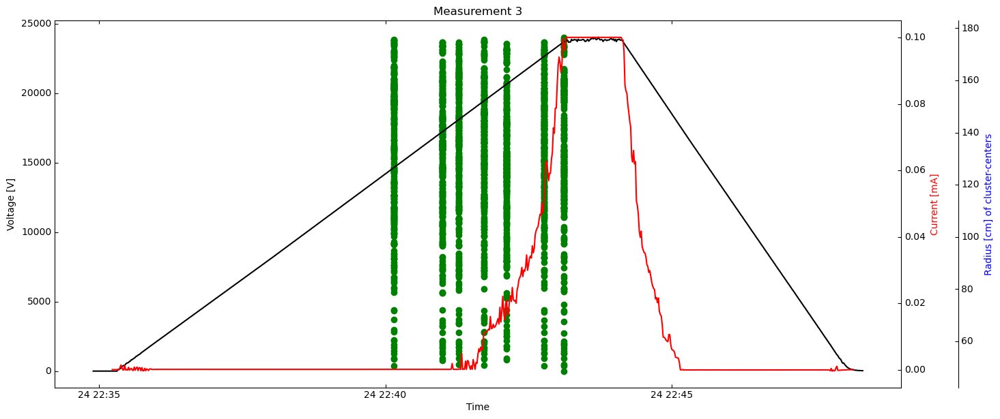

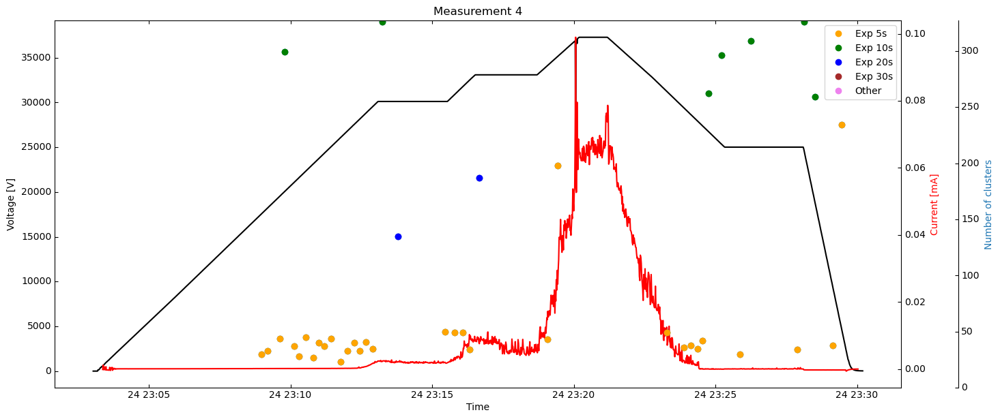

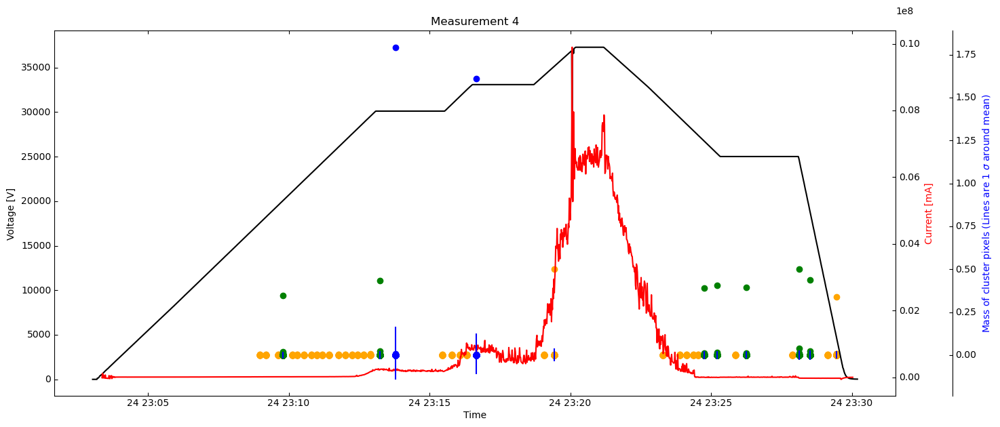

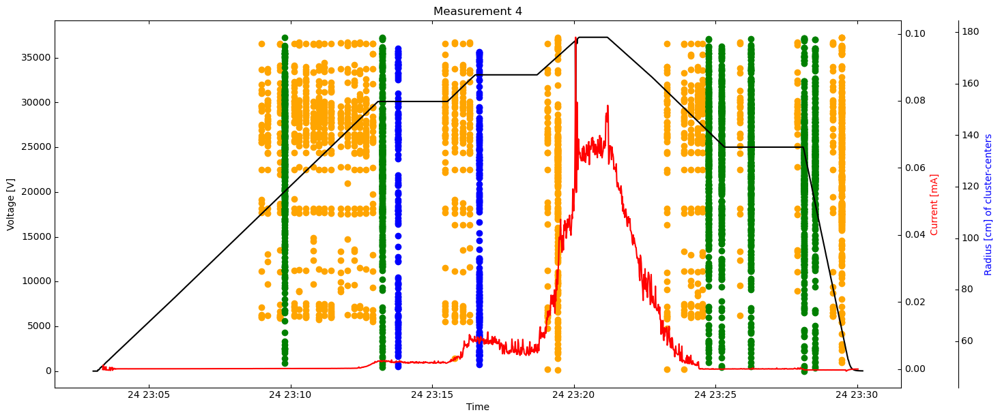

In [10]:
for id, tm in enumerate(test_measurements):
    voltage = tm.data['voltage']
    current = tm.data['current']
    time = tm.data['time']
    
    offset = 60

    img_time = np.array(tm.image_data['time'])
    n_clusters = np.array(tm.image_data['n_clusters'])
    exp5_ids = [i for i, t in enumerate(tm.image_data['exposure']) if t == 5]
    exp10_ids = [i for i, t in enumerate(tm.image_data['exposure']) if t == 10]
    exp20_ids = [i for i, t in enumerate(tm.image_data['exposure']) if t == 20]
    exp30_ids = [i for i, t in enumerate(tm.image_data['exposure']) if t == 30]
    exp_other_ids = [i for i, t in enumerate(tm.image_data['exposure']) if t < 5]

    mass_sum = [sum(mlist) for mlist in tm.image_data['masses']]
    mass_mean = [np.mean(mlist) for mlist in tm.image_data['masses']]
    mass_std = [np.std(mlist) for mlist in tm.image_data['masses']]
    # m per px = ~1.3m per 3712 px
    radii = [[np.sqrt(p[0]**2+p[1]**2) * 130./3712. for p in plist] for plist in tm.image_data['cluster_positions']]

    fig1 = plt.figure(figsize=(16, 7))
    voltage_ax1 = host_subplot(111, axes_class=AA.Axes, figure=fig1)
    current_ax1 = voltage_ax1.twinx()

    fig2 = plt.figure(figsize=(16, 7))
    voltage_ax2 = host_subplot(111, axes_class=AA.Axes, figure=fig2)
    current_ax2 = voltage_ax2.twinx()

    fig3 = plt.figure(figsize=(16, 7))
    voltage_ax3 = host_subplot(111, axes_class=AA.Axes, figure=fig3)
    current_ax3 = voltage_ax3.twinx()

    for axis in [current_ax1, current_ax2, current_ax3]:
        axis.axis["right"].toggle(all=True)

    nclusters_ax = voltage_ax1.twinx()
    mass_ax = voltage_ax2.twinx()
    radius_ax = voltage_ax3.twinx()
    for i, axis in enumerate([nclusters_ax, mass_ax, radius_ax]):
        new_fixed_axis = axis.get_grid_helper().new_fixed_axis
        axis.axis["right"] = new_fixed_axis(loc="right", axes=axis, offset=(offset, 0))
        axis.axis["right"].toggle(all=True)

    p3, = nclusters_ax.plot(img_time, n_clusters, 'o')
    nclusters_ax.plot(img_time[exp5_ids], n_clusters[exp5_ids], 'o', label='Exp 5s', color='orange')
    nclusters_ax.plot(img_time[exp10_ids], n_clusters[exp10_ids], 'o', label='Exp 10s', color='green')
    nclusters_ax.plot(img_time[exp20_ids], n_clusters[exp20_ids], 'o', label='Exp 20s', color='blue')
    nclusters_ax.plot(img_time[exp30_ids], n_clusters[exp30_ids], 'o', label='Exp 30s', color='brown')
    nclusters_ax.plot(img_time[exp_other_ids], n_clusters[exp_other_ids], 'o', label='Other', color='violet')
    nclusters_ax.legend()
    mass_ax.errorbar(img_time, mass_mean, yerr=mass_std, marker='o', linestyle='none', color='blue', markersize=0)
    #mass_ax.plot(img_time, mass_sum, marker='o', linestyle='none', color='blue')
    for i, n in enumerate(n_clusters):
        if tm.image_data['exposure'][i] == 5:
            mass_ax.scatter([img_time[i]]*n, tm.image_data['masses'][i], color='orange', label='Exp 5s')
            radius_ax.scatter([img_time[i]]*n, radii[i], color='orange', label='Exp 5s')
        elif tm.image_data['exposure'][i] == 10:
            mass_ax.scatter([img_time[i]]*n, tm.image_data['masses'][i], color='green', label='Exp 10s')
            radius_ax.scatter([img_time[i]]*n, radii[i], color='green', label='Exp 10s')
        elif tm.image_data['exposure'][i] == 20:
            mass_ax.scatter([img_time[i]]*n, tm.image_data['masses'][i], color='blue', label='Exp 20s')
            radius_ax.scatter([img_time[i]]*n, radii[i], color='blue', label='Exp 20s')
        elif tm.image_data['exposure'][i] == 30:
            mass_ax.scatter([img_time[i]]*n, tm.image_data['masses'][i], color='brown', label='Exp 30s')
            radius_ax.scatter([img_time[i]]*n, radii[i], color='brown', label='Exp 30s')
        else:
            mass_ax.scatter([img_time[i]]*n, tm.image_data['masses'][i], color='violet', label='Other')
            radius_ax.scatter([img_time[i]]*n, radii[i], color='violet', label='Other')

    for voltage_ax in [voltage_ax1, voltage_ax2, voltage_ax3]:
        p1, = voltage_ax.plot(time, -1*voltage, color='black')
        voltage_ax.axis["left"].label.set_color(p1.get_color())
        voltage_ax.set_ylabel('Voltage [V]')
        voltage_ax.set_xlabel('Time')
        voltage_ax.set_title(f'Measurement {id+1}')
    for current_ax in [current_ax1, current_ax2, current_ax3]:
        p2, = current_ax.plot(time[20:-10], -1*current[20:-10], color='red')
        current_ax.axis["right"].label.set_color(p2.get_color())
        current_ax.set_ylabel('Current [mA]')
    nclusters_ax.axis["right"].label.set_color(p3.get_color())
    nclusters_ax.set_ylabel('Number of clusters')
    nclusters_ax.set_ylim(0, max(n_clusters)+1)
    mass_ax.axis["right"].label.set_color('blue')
    mass_ax.set_ylabel(r'Mass of cluster pixels (Lines are 1 $\sigma$ around mean)')
    radius_ax.axis["right"].label.set_color('blue')
    radius_ax.set_ylabel('Radius [cm] of cluster-centers')
    plt.show()

In [14]:
img_exposures = []
n_clusters = []
n_clusters_per_voltage = []
cluster_exposures = []
cluster_areas = []
cluster_masses = []
cluster_voltages = []
for tm in test_measurements:
    explist = tm.image_data['exposure']
    img_exposures.extend(explist)
    nlist = tm.image_data['n_clusters']
    n_clusters.extend(nlist)
    voltage = tm.data['voltage'].values
    time = tm.data['time']
    img_times = tm.image_data['time']
    img_time_ids = np.searchsorted(time, img_times)
    img_voltages = voltage[img_time_ids]
    n_clusters_per_voltage.extend(np.array(nlist) / -1*img_voltages)
    for i_img, n in enumerate(nlist):
        for i_cluster in range(n):
            cluster_exposures.append(explist[i_img])
            cluster_areas.append(tm.image_data['areas'][i_img][i_cluster])
            cluster_masses.append(tm.image_data['masses'][i_img][i_cluster])
            cluster_voltages.append(img_voltages[i_img])

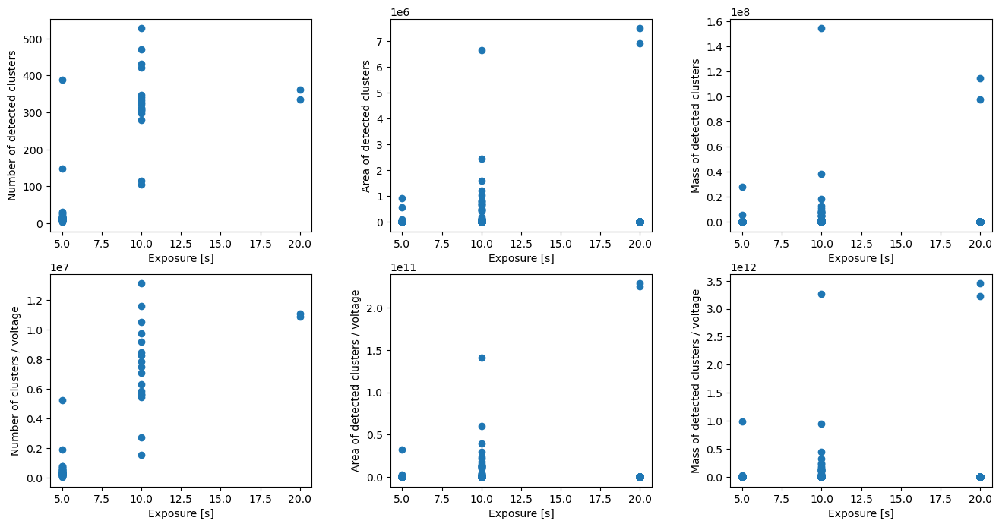

In [15]:
fig, ax = plt.subplots(2, 3, figsize=(16, 8))
ax[0][0].plot(img_exposures, n_clusters, 'o')
ax[0][0].set_xlabel('Exposure [s]')
ax[0][0].set_ylabel('Number of detected clusters')
ax[0][1].plot(cluster_exposures, cluster_areas, 'o')
ax[0][1].set_xlabel('Exposure [s]')
ax[0][1].set_ylabel('Area of detected clusters')
ax[0][2].plot(cluster_exposures, cluster_masses, 'o')
ax[0][2].set_xlabel('Exposure [s]')
ax[0][2].set_ylabel('Mass of detected clusters')
ax[1][0].plot(img_exposures, n_clusters_per_voltage, 'o')
ax[1][0].set_xlabel('Exposure [s]')
ax[1][0].set_ylabel('Number of clusters / voltage')
ax[1][1].plot(cluster_exposures, np.array(cluster_areas) / -1*np.array(cluster_voltages), 'o')
ax[1][1].set_xlabel('Exposure [s]')
ax[1][1].set_ylabel('Area of detected clusters / voltage')
ax[1][2].plot(cluster_exposures, np.array(cluster_masses) / -1*np.array(cluster_voltages), 'o')
ax[1][2].set_xlabel('Exposure [s]')
ax[1][2].set_ylabel('Mass of detected clusters / voltage')
plt.subplots_adjust(wspace=0.3)
plt.show()

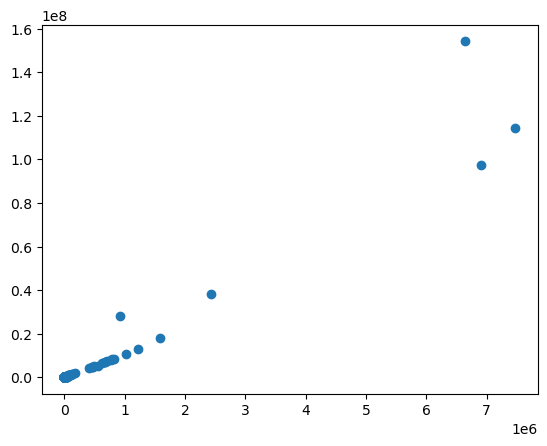

In [16]:
plt.scatter(cluster_areas, cluster_masses)

# Investigate individual images

Y:\Cathode\LocalHVTest\SpareMesh_2nd_230502\NIKON\Test3\DSC_2389.JPG
[]


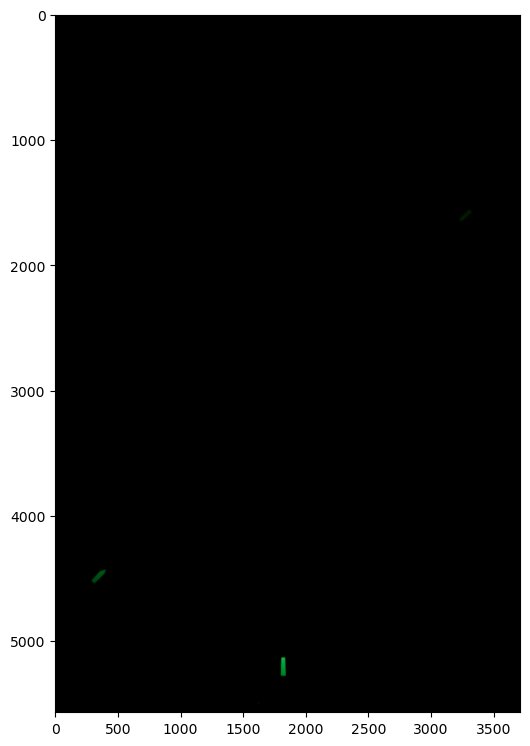

In [42]:
img_id = 43
tm = test_measurements[2]
print(tm.image_files[img_id])
fig, ax = tm.plot_image(img_id)
cluster_positions = np.array(tm.image_data['cluster_positions'][img_id])
print(tm.image_data['areas'][img_id])
if len(cluster_positions) != 0:
    ax.plot(cluster_positions[:,0], cluster_positions[:,1], 'o', color='red', markersize=1)
fig.set_size_inches((6, 12))
plt.show()

168.47561838636625
Found 625 clusters
with areas [58, 124, 3758, 38, 70, 4, 632, 1, 290, 4, 3, 2, 6, 3, 20, 2, 44, 4, 23, 1, 48, 1, 363, 3, 1, 2257, 833, 9, 24, 1, 1, 23, 16, 8, 316, 6, 4, 4, 2, 4, 1, 64, 2, 1, 2, 9, 6, 3, 13, 16, 15, 12, 12, 423, 1, 1, 66, 20, 10, 10, 27, 21, 15, 1, 6, 2, 4, 1, 2, 4, 5, 8, 2, 4835, 9, 2, 2, 2, 2, 1, 3, 3, 2, 22, 16, 4, 24, 3, 1, 6, 1, 7, 625, 2, 99, 1, 3, 2, 3, 220, 13, 52, 58, 1, 6, 1, 2, 159, 4, 3, 12, 104, 1, 15, 5, 3, 4, 8, 916712, 10666, 634, 617, 1289, 1154, 8, 1, 9, 12, 90, 4631, 13, 574, 16, 3, 1484, 13, 25, 14, 65, 1308, 123, 320, 82, 42, 52, 28, 1, 67]


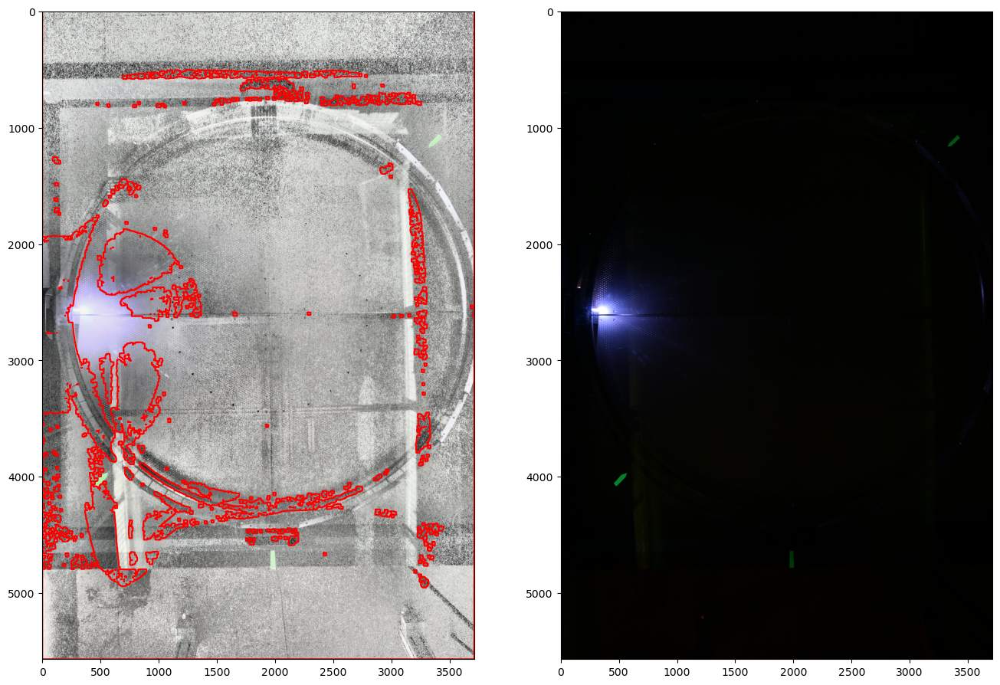

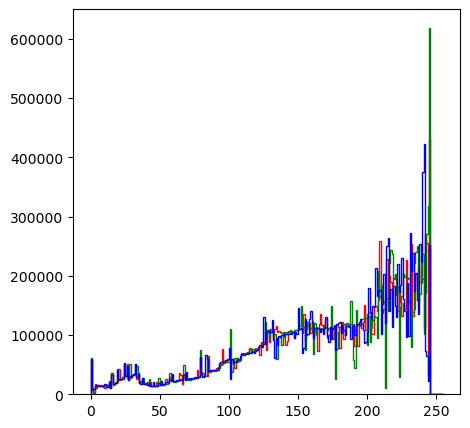

In [20]:
orig = cv2.imread(tm.image_files[img_id], cv2.IMREAD_COLOR)[:,:,::-1]
img = cv2.imread(tm.image_files[img_id], cv2.IMREAD_COLOR)[:,:,::-1]
img = processing.increase_brightness(processing.increase_contrast(gaussian_filter(img, sigma=0.1), clip_limit=200), value=-10)
#img = processing.increase_contrast(processing.increase_brightness(img, value=10), clip_limit=100)
print(np.mean(img))
contours = get_cluster_contours(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), binary_threshold=190)
areas = tm.image_data['areas'][img_id]
print(f'Found {len(contours)} clusters')
print(f'with areas {areas}')
fig, ax = plt.subplots(1, 2, figsize=(16, 12))
ax[0].imshow(img)
ax[1].imshow(orig)
for c in contours:
    ax[0].plot(c[:,:,0], c[:,:,1], color='red')
hfig, hax = plt.subplots(1, 1, figsize=(5, 5))
bins = np.linspace(0, 255, 256)
hax.hist(img[:,:,0].flatten(), histtype='step', color='red', bins=bins)
hax.hist(img[:,:,1].flatten(), histtype='step', color='green', bins=bins)
hax.hist(img[:,:,2].flatten(), histtype='step', color='blue', bins=bins)
plt.show()

# Glow and sparks

In [43]:
if test_run == 1:
    background_images = [cv2.imread(os.path.join(PATH_TO_IMAGES, 'DSC_1954_positionCalibration.JPG'), cv2.IMREAD_COLOR)[:,:,::-1] for _ in range(len(all_data_files))]
elif test_run == 2:
    background_images = [cv2.imread(os.path.join(PATH_TO_IMAGES, f), cv2.IMREAD_COLOR)[:,:,::-1] for f in ['DSC_2053.JPG', 'DSC_2271.JPG', 'DSC_2456.JPG']]

In [45]:
spark_threshold = 1e5
min_area = 5

tm = test_measurements[2]
print(len(tm.image_files))

p_noise = []
p_glow = []
p_spark = []
for i, file in enumerate(tm.image_files):
    cluster_areas = tm.image_data['areas'][i]
    for j, area in enumerate(cluster_areas):
        if area < min_area:
            p_noise.append(tm.image_data['cluster_positions'][i][j])
        elif area > spark_threshold:
            p_spark.append(tm.image_data['cluster_positions'][i][j])
        else:
            p_glow.append(tm.image_data['cluster_positions'][i][j])

109


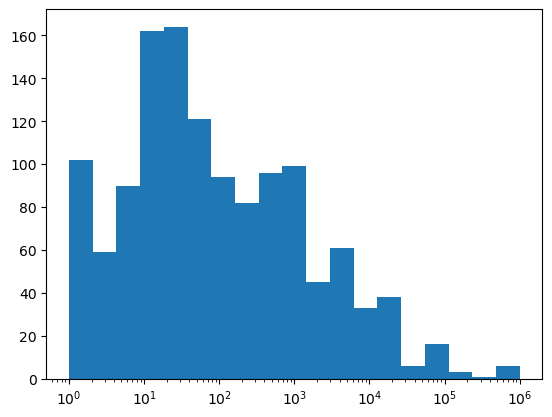

In [46]:
bins = np.logspace(0, 6, 20)
all_areas = [area for clusterlist in tm.image_data['areas'] for area in clusterlist]
plt.hist(all_areas, bins=bins)
plt.xscale('log')
plt.show()

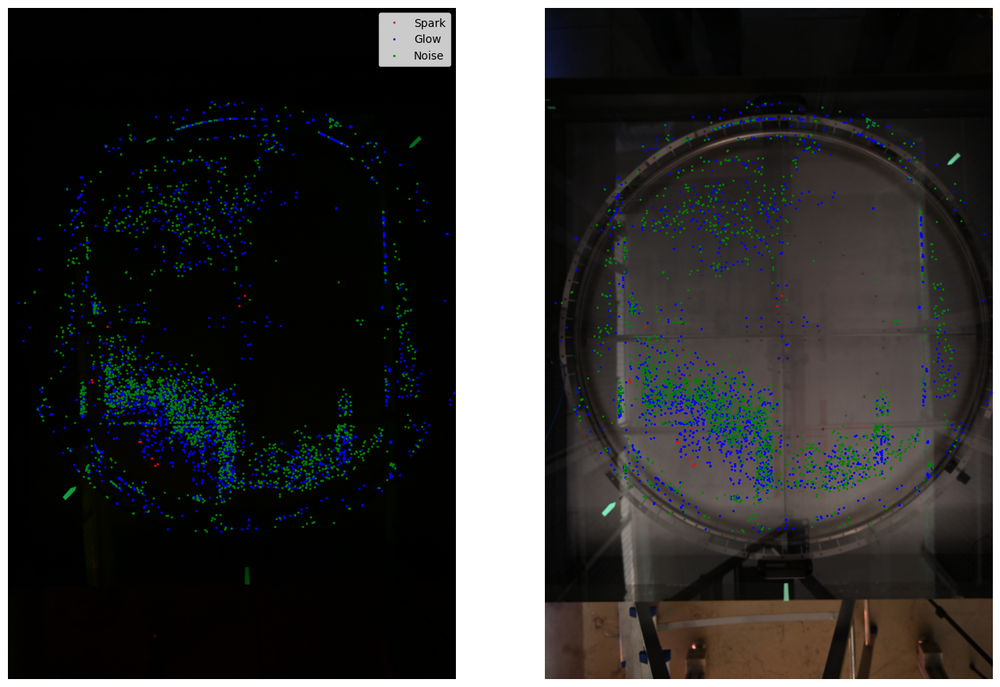

In [27]:
img_id = 6

img = cv2.imread(tm.image_files[img_id], cv2.IMREAD_COLOR)[:,:,::-1]
fig, ax = plt.subplots(1, 2, figsize=(16, 16))
ax[0].imshow(img)
ax[0].plot(np.array(p_spark)[:,0],np.array(p_spark)[:,1], 'o', color='red', markersize=1, label='Spark')
ax[0].plot(np.array(p_glow)[:,0],np.array(p_glow)[:,1], 'o', color='blue', markersize=1, label='Glow')
ax[0].plot(np.array(p_noise)[:,0],np.array(p_noise)[:,1], 'o', color='green', markersize=1, label='Noise')
ax[0].legend()
ax[1].imshow(background_images[0])#os.path.join(_PATH, 'images', 'DSC_2033.JPG')
ax[1].plot(np.array(p_spark)[:,0],np.array(p_spark)[:,1], 'o', color='red', markersize=1)
ax[1].plot(np.array(p_glow)[:,0],np.array(p_glow)[:,1], 'o', color='blue', markersize=1)
ax[1].plot(np.array(p_noise)[:,0],np.array(p_noise)[:,1], 'o', color='green', markersize=1)
for axis in ax:
    axis.set_axis_off()
    #axis.set_xlim(3200, 3300)
    #axis.set_ylim(1250, 1350)
plt.show()

In [25]:
smallest_area_cluster_id = np.argmin(tm.image_data['areas'][img_id])
tm.image_data['areas'][img_id][smallest_area_cluster_id]

2

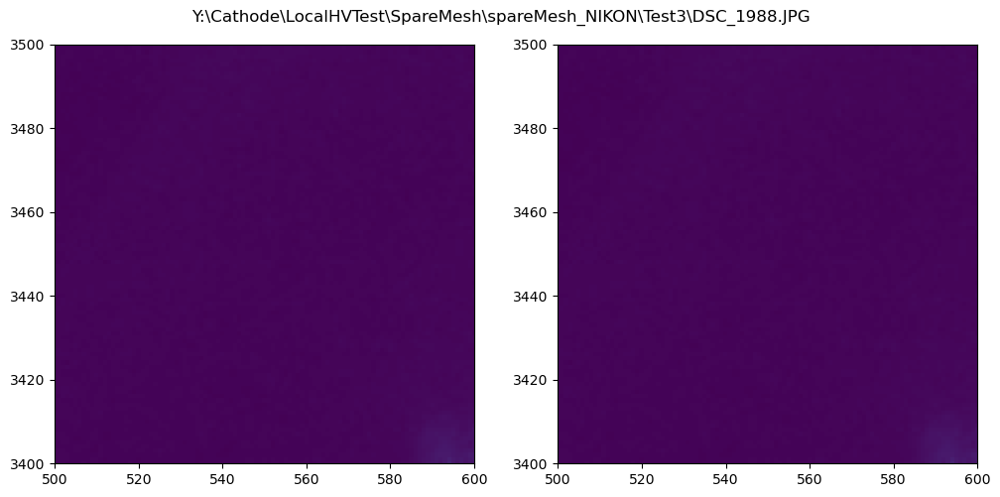

In [26]:
img = cv2.imread(tm.image_files[img_id], cv2.IMREAD_GRAYSCALE)
contours = get_cluster_contours(img)
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
fig.suptitle(tm.image_files[img_id], y=0.7)
ax[0].imshow(img)
ax[1].imshow(img)
ax[1].plot(*tm.image_data['cluster_positions'][img_id][smallest_area_cluster_id], marker='o', linestyle='none', color='red', markersize=3)
for c in contours:
    ax[1].plot(c[:,:,0], c[:,:,1], color='red')
for axis in ax:
    axis.set_xlim(500, 600)
    axis.set_ylim(3400, 3500)
plt.show()

# 2D histogram

In [11]:
def get_cluster_pixels(img, binary_threshold=50):
    _, mask = cv2.threshold(img, binary_threshold, 1, cv2.THRESH_BINARY)
    return mask

def get_cluster_rrcc(img):
    cluster_pixels = get_cluster_pixels(img)
    return cluster_pixels.nonzero()

In [48]:
tm = test_measurements[2]
test_id = 23
test_file = tm.image_files[test_id]

cluster_pixels = get_cluster_pixels(tm.get_processed_image(test_file), binary_threshold=30)
rr, cc = cluster_pixels.nonzero()

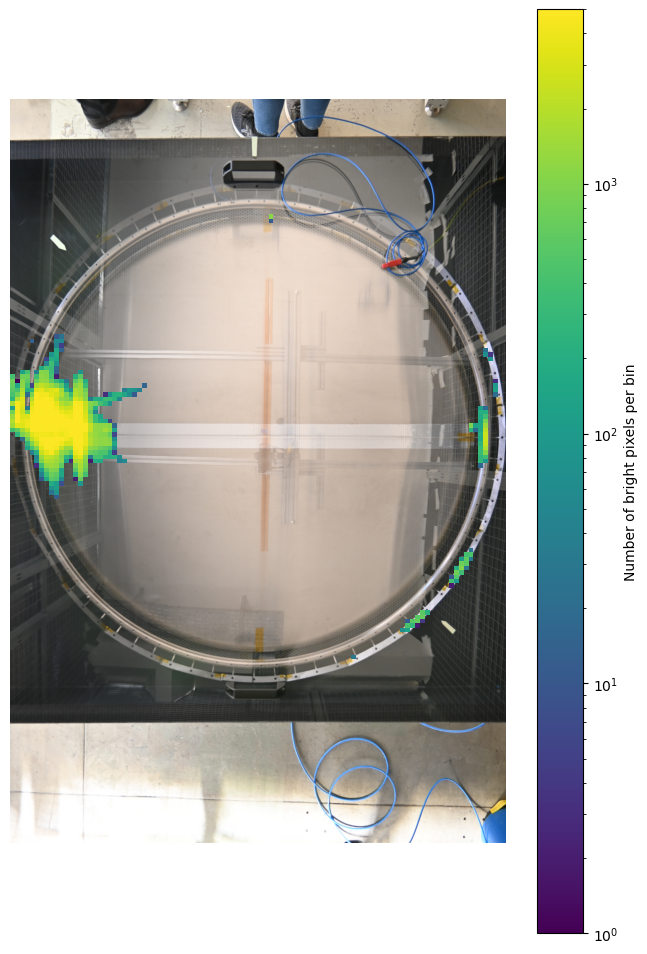

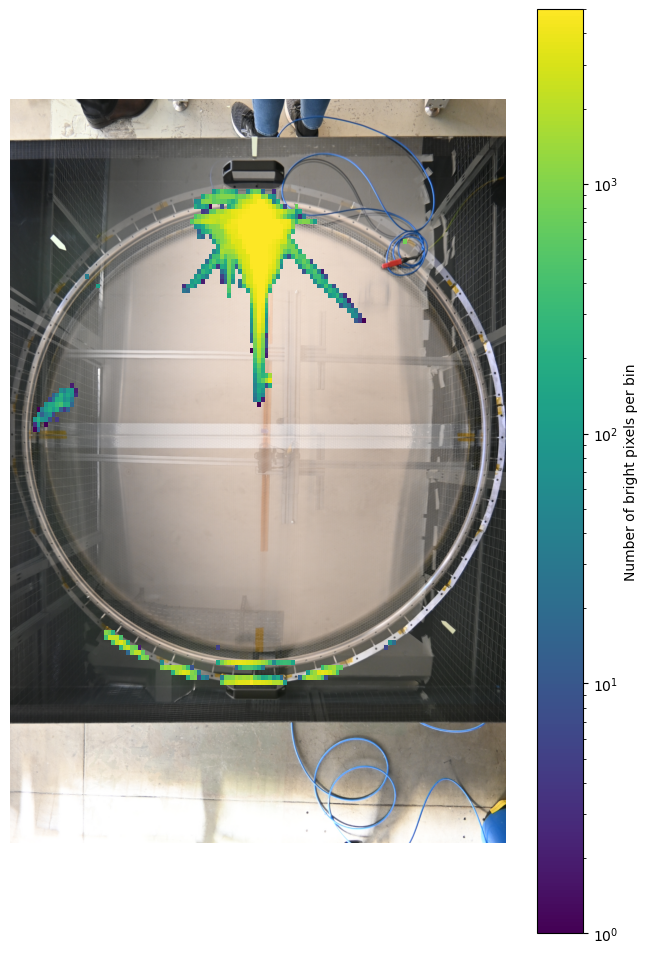

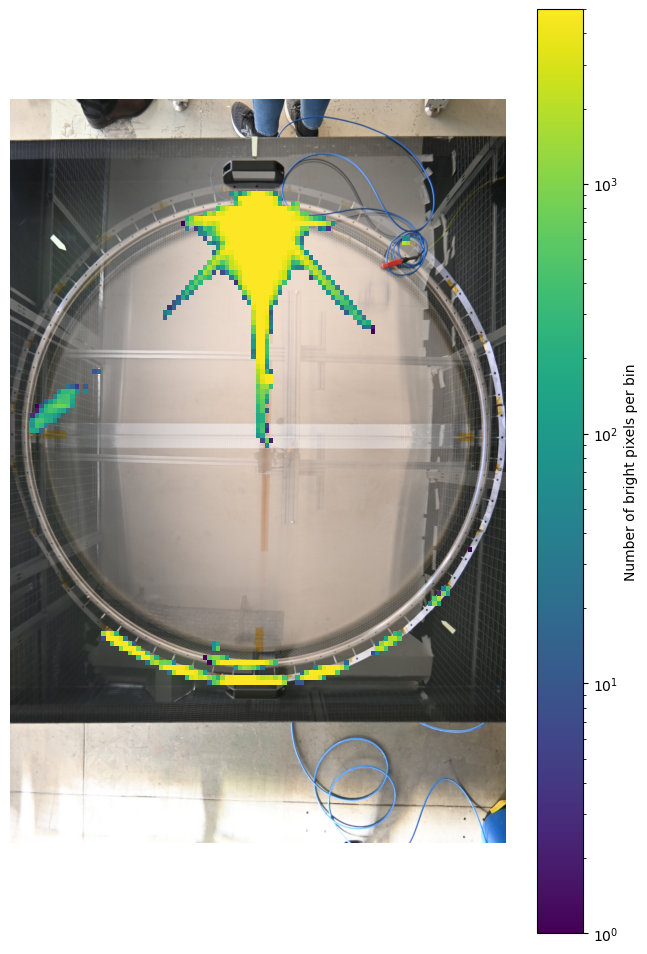

In [49]:
for i, tm in enumerate(test_measurements):    
    r_col = []
    c_col = []
    for f in tm.image_files:
        cluster_pixels = get_cluster_pixels(tm.get_processed_image(f), binary_threshold=30)
        rr, cc = cluster_pixels.nonzero()
        r_col.extend(rr)
        c_col.extend(cc)
        
    fig, ax = plt.subplots(1, 1, figsize=(8, 12))
    ax.imshow(background_images[i], origin='lower')
    hist, xedges, yedges, im = ax.hist2d(c_col, r_col, bins=100, norm=mpl.colors.LogNorm(vmin=1, vmax=5000))
    ax.set_xlim(0, background_images[i].shape[1])
    ax.set_ylim(0, background_images[i].shape[0])
    ax.set_axis_off()
    fig.colorbar(im, ax=ax, label='Number of bright pixels per bin')
    plt.show()

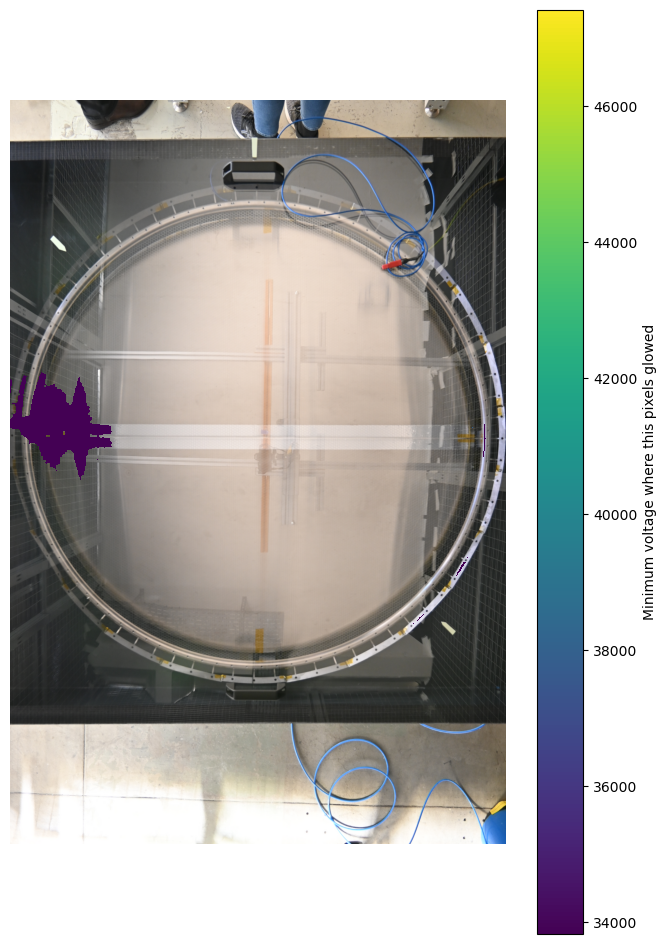

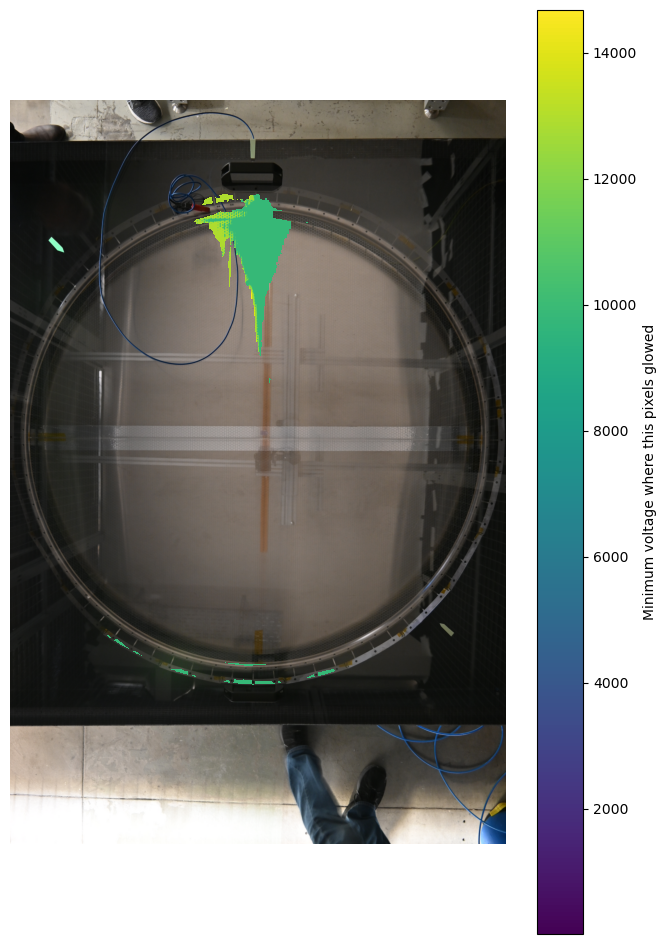

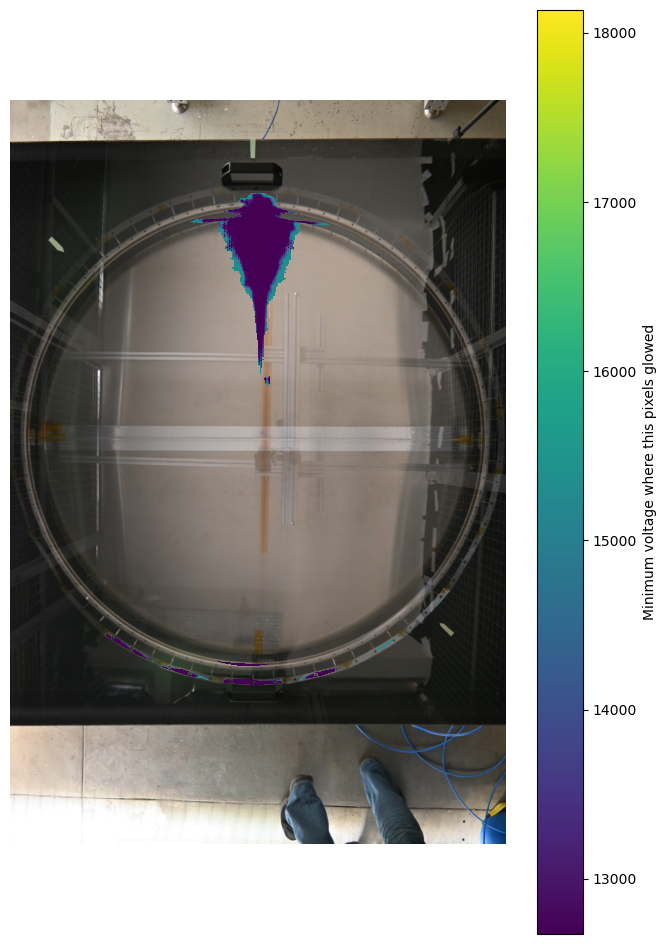

In [65]:
for i, tm in enumerate(test_measurements):
    voltage_times = tm.data['time']
    voltage = tm.data['voltage'].values
    img_times = np.array(tm.image_data['time'])
    img_time_ids = np.searchsorted(voltage_times, img_times)
    img_voltages = voltage[img_time_ids]

    min_voltages = np.zeros(background_images[0].shape[:-1]) + np.inf
    for j, f in enumerate(tm.image_files):
        cluster_pixels = get_cluster_pixels(tm.get_processed_image(f), binary_threshold=30)
        rr, cc = cluster_pixels.nonzero()
        temp = np.zeros(min_voltages.shape) + np.inf
        temp[rr,cc] = -1*img_voltages[j]
        min_voltages = np.where(temp < min_voltages, temp, min_voltages)
    
    min_voltages = np.where(min_voltages == np.inf, 0, min_voltages)
    masked_data = np.ma.masked_where(min_voltages == 0, min_voltages)
    fig, ax = plt.subplots(1, 1, figsize=(8, 12))
    ax.imshow(background_images[i], origin='lower')
    im = ax.imshow(masked_data, origin='lower')
    ax.set_xlim(0, background_images[i].shape[1])
    ax.set_ylim(0, background_images[i].shape[0])
    ax.set_axis_off()
    fig.colorbar(im, ax=ax, label='Minimum voltage where this pixels glowed')
    plt.show()

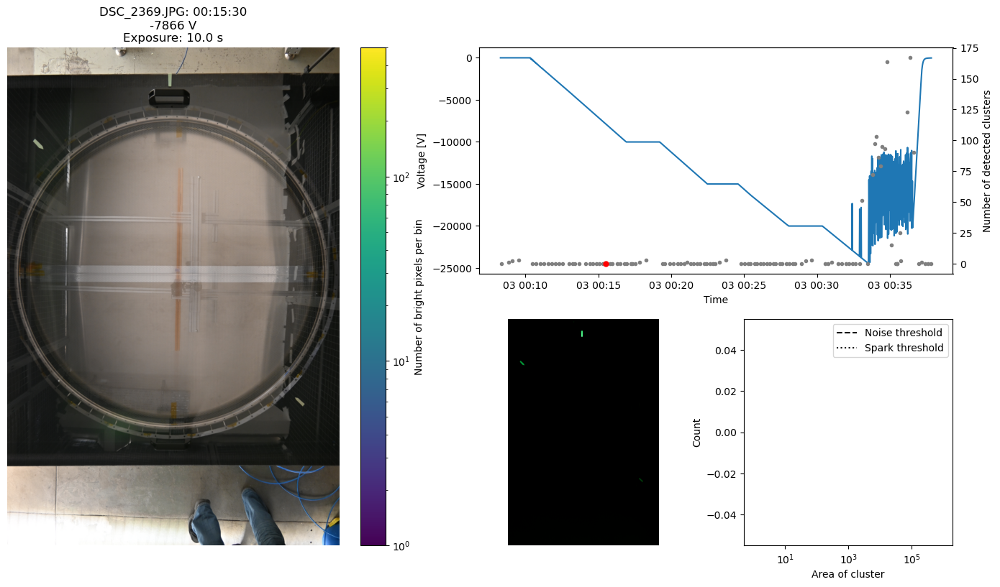

In [50]:
voltage_times = tm.data['time']
voltage = tm.data['voltage'].values
img_times = np.array(tm.image_data['time'])
img_time_ids = np.searchsorted(voltage_times, img_times)
img_voltages = voltage[img_time_ids]
min_area = 5
area_threshold = 1e5

gs_kw = dict(width_ratios=[2, 1, 1])
fig, ax = plt.subplot_mosaic([['left', 'upper right', 'upper right'],
                              ['left', 'lower center', 'lower right']], figsize=(17, 9), gridspec_kw=gs_kw)
ax['left'].imshow(background_images[2], origin='lower')
hist, xedges, yedges, im = ax['left'].hist2d(cc, rr, bins=50, norm=mpl.colors.LogNorm(vmin=1, vmax=500))
ax['left'].set_xlim(0, background_images[2].shape[1])
ax['left'].set_ylim(0, background_images[2].shape[0])
ax['left'].set_axis_off()
title = f'{test_file.split(os.path.sep)[-1]}: ' + str(img_times[test_id]).split(' ')[-1] + f'\n{img_voltages[test_id] :.0f} V\nExposure: ' + str(tm.image_data['exposure'][test_id]) + ' s'
ax['left'].set_title(title)
fig.colorbar(im, ax=ax['left'], label='Number of bright pixels per bin')

ax['upper right'].plot(tm.data['time'], tm.data['voltage'])
ax['upper right'].set_xlabel('Time')
ax['upper right'].set_ylabel('Voltage [V]')

n_clusters_ax = ax['upper right'].twinx()
n_clusters_ax.plot(tm.image_data['time'], tm.image_data['n_clusters'], 'o', markersize=3, color='gray')
n_clusters_ax.plot(tm.image_data['time'][test_id], tm.image_data['n_clusters'][test_id], 'o', markersize=5, color='red')
n_clusters_ax.set_ylabel('Number of detected clusters')

ax['lower center'].imshow(cv2.imread(tm.image_files[test_id], cv2.IMREAD_COLOR)[:,:,::-1], origin='lower')
ax['lower center'].set_axis_off()

bins = np.logspace(0, 6, 20)
counts, _, _ = ax['lower right'].hist(tm.image_data['areas'][test_id], bins=bins)
maxcount = max(counts)
ax['lower right'].vlines(x=min_area, ymin=0, ymax=maxcount, color='black', linestyle='--', label='Noise threshold')
ax['lower right'].vlines(x=area_threshold, ymin=0, ymax=maxcount, color='black', linestyle=':', label='Spark threshold')
ax['lower right'].set_xscale('log')
ax['lower right'].set_xlabel('Area of cluster')
ax['lower right'].set_ylabel('Count')
ax['lower right'].legend(loc='upper right')
plt.show()

In [73]:
plot_dir = 'C:\\Users\\tm3408\\Desktop\\phd\\workspace\\hv_image_processing\\plots\\test_05_02\\measurement_ar2'

In [74]:
test_files = tm.image_files
voltage_times = tm.data['time']
voltage = tm.data['voltage'].values
img_times = np.array(tm.image_data['time'])
img_time_ids = np.searchsorted(voltage_times, img_times)
img_voltages = voltage[img_time_ids]
min_area = 5
area_threshold = 1e5

background_img = background_images[2]

images = []
for i, f in enumerate(test_files):
    cluster_pixels = get_cluster_pixels(tm.get_processed_image(f), binary_threshold=30)
    rr, cc = cluster_pixels.nonzero()

    gs_kw = dict(width_ratios=[2, 1, 1])
    fig, ax = plt.subplot_mosaic([['left', 'upper right', 'upper right'],
                                ['left', 'lower center', 'lower right']], figsize=(17, 9), gridspec_kw=gs_kw)
    ax['left'].imshow(background_img, origin='lower')
    hist, xedges, yedges, im = ax['left'].hist2d(cc, rr, bins=100, norm=mpl.colors.LogNorm(vmin=1, vmax=500), cmap='viridis')
    ax['left'].set_xlim(0, background_img.shape[1])
    ax['left'].set_ylim(0, background_img.shape[0])
    ax['left'].set_axis_off()
    title = f'{f.split(os.path.sep)[-1]}: ' + str(img_times[i]).split(' ')[-1] + f'\n{img_voltages[i] :.0f} V\nExposure: ' + str(tm.image_data['exposure'][i]) + ' s'
    ax['left'].set_title(title)
    fig.colorbar(im, ax=ax['left'], label='Number of bright pixels per bin')

    ax['upper right'].plot(tm.data['time'], tm.data['voltage'])
    ax['upper right'].set_xlabel('Time')
    ax['upper right'].set_ylabel('Voltage [V]')

    n_clusters_ax = ax['upper right'].twinx()
    n_clusters_ax.plot(tm.image_data['time'], tm.image_data['n_clusters'], 'o', markersize=3, color='gray')
    n_clusters_ax.plot(tm.image_data['time'][i], tm.image_data['n_clusters'][i], 'o', markersize=5, color='red')
    n_clusters_ax.set_ylabel('Number of detected clusters')

    ax['lower center'].imshow(cv2.imread(tm.image_files[i], cv2.IMREAD_COLOR)[:,:,::-1])
    ax['lower center'].set_axis_off()

    bins = np.logspace(0, 6, 20)
    counts, _, _ = ax['lower right'].hist(tm.image_data['areas'][i], bins=bins)
    maxcount = max(counts)
    ax['lower right'].vlines(x=min_area, ymin=0, ymax=maxcount, color='black', linestyle='--', label='Noise threshold')
    ax['lower right'].vlines(x=area_threshold, ymin=0, ymax=maxcount, color='black', linestyle=':', label='Spark threshold')
    ax['lower right'].set_xscale('log')
    ax['lower right'].set_xlabel('Area of cluster')
    ax['lower right'].set_ylabel('Count')
    ax['lower right'].legend(loc='upper right')
    name = os.path.join(plot_dir, f'pixel_density_overlay_{str(i).zfill(3)}.png')
    fig.savefig(name, bbox_inches='tight')
    plt.close(fig)
    images.append(imageio.v2.imread(name))

In [75]:
imageio.mimsave(os.path.join(plot_dir, 'pixel_density_overlay.mov'), images, fps=1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1381, 817) to (1392, 832) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


# Stack images

In [12]:
if test_run == 1:
    tm = test_measurements[1]
    spark_file = tm.image_files[8]
    print(len(tm.image_files))
    test_files = tm.image_files[5:8]
    print(tm.image_data['exposure'][5:8])
elif test_run == 2:
    tm = test_measurements[1]
    spark_file = tm.image_files[61]
    test_files = tm.image_files[59:61]
    print(tm.image_data['exposure'][59:61])
spark_img = cv2.imread(spark_file, cv2.IMREAD_COLOR)[:,:,::-1]
print(spark_file)
test_imgs = [cv2.imread(f, cv2.IMREAD_COLOR)[:,:,::-1] for f in test_files]
sum_img = np.clip(np.sum(test_imgs, axis=0), 0, 255).astype(np.uint8)
print(sum_img.shape)

11
[5.0, 5.0, 5.0]
Y:\Cathode\LocalHVTest\SpareMesh\spareMesh_NIKON\Test2\DSC_1971.JPG
(5568, 3712, 3)


67.35761069772674 8.011392630004785


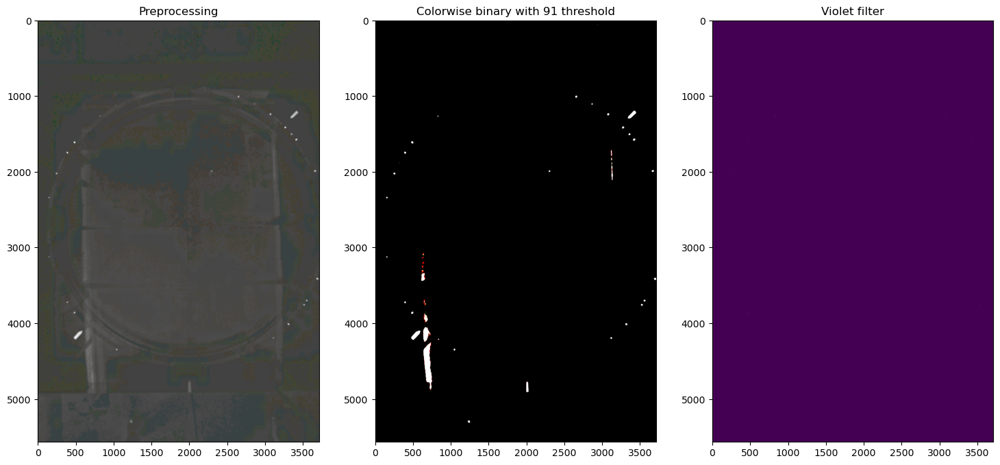

126


In [13]:
offset = 60
processed_img = processing.increase_brightness(processing.increase_contrast(gaussian_filter(sum_img, sigma=3.), clip_limit=2, tile_grid_size=(50, 50)), value=offset)
mean, std = np.mean(processed_img), np.std(processed_img)
binary_threshold = mean + 3.*std
print(mean, std)
# contours = get_cluster_contours(cv2.cvtColor(processed_img, cv2.COLOR_RGB2GRAY), binary_threshold=binary_threshold)
_, binary = cv2.threshold(processed_img, binary_threshold, 255, cv2.THRESH_BINARY)
binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, np.ones((10, 10), np.uint8))
violet_filtered = np.where(binary[:,:,2] > 1.1*(binary[:,:,0] + binary[:,:,1]), 1, 0)
#violet_filtered = np.where((0.2*binary[:,:,0] + binary[:,:,2]) > 1.2*(binary[:,:,0] + binary[:,:,1]), 1, 0)
violet_filtered = np.uint8(violet_filtered)
contours, _ = cv2.findContours(image=violet_filtered, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
fig, ax = plt.subplots(1, 3, figsize=(18, 8))
ax[0].imshow(processed_img)
ax[0].set_title('Preprocessing')
ax[1].imshow(binary)
ax[1].set_title(f'Colorwise binary with {binary_threshold :.0f} threshold')
ax[2].imshow(violet_filtered)
ax[2].set_title('Violet filter')
plt.show()
print(len(contours))

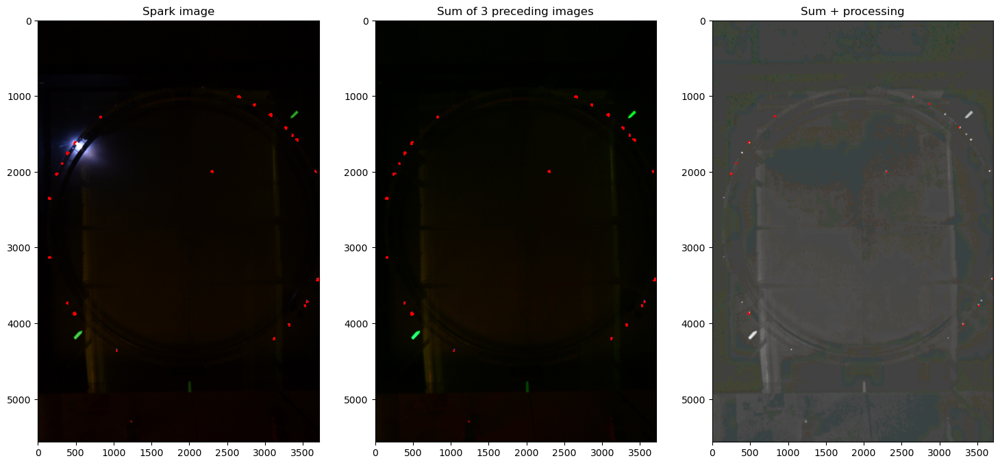

In [14]:
fig, ax = plt.subplots(1, 3, figsize=(18, 8))
ax[0].imshow(spark_img)
ax[0].set_title('Spark image')
ax[1].imshow(sum_img)
ax[1].set_title(f'Sum of {len(test_files)} preceding images')
ax[2].imshow(processed_img)
ax[2].set_title('Sum + processing')
for c in contours:
    x, y = np.mean(c[:,:,0]), np.mean(c[:,:,1])
    if np.sqrt((x-spark_img.shape[1]//2)**2 + (y-spark_img.shape[0]//2)**2) < spark_img.shape[1]//2+500:
        ax[0].plot(x, y, color='red', marker='o', markersize=1)
        ax[1].plot(x, y, color='red', marker='o', markersize=1)
        ax[2].plot(c[:,:,0], c[:,:,1], color='red')
if False:
    for axis in ax:
        axis.set_xlim(1800, 2100)
        axis.set_ylim(4200, 4500)
plt.show()

# Ring pattern

In [125]:
test_files = tm.image_files[5:10]

processed_images = [processing.increase_contrast(processing.increase_brightness(gaussian_filter(cv2.imread(f, cv2.IMREAD_COLOR)[:,:,::-1], sigma=.1), value=20), clip_limit=200) for f in test_files]

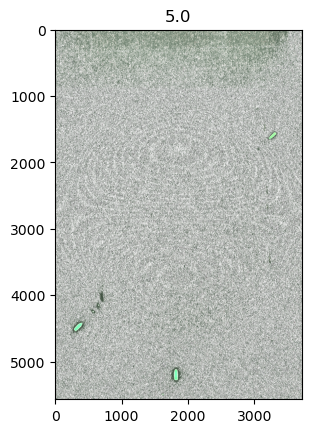

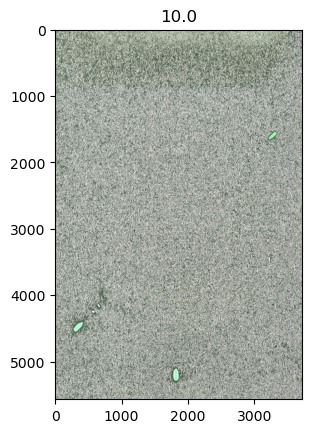

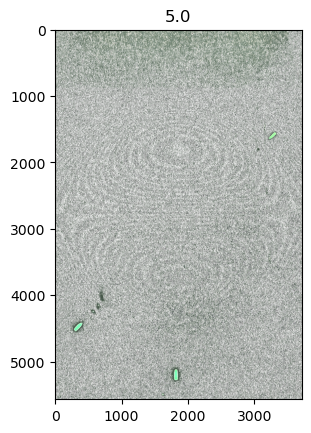

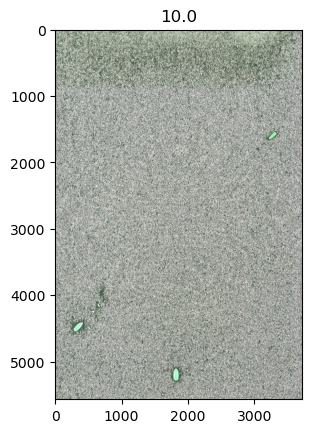

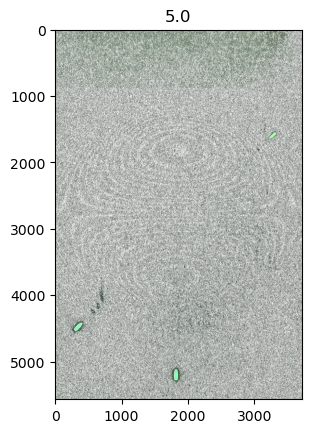

In [127]:
for i, img in enumerate(processed_images):
    plt.title(tm.image_data['exposure'][5+i])
    plt.imshow(img)
    plt.show()

In [66]:
plt.imshow(processed_images[0] - processed_images[2])

NameError: name 'processed_images' is not defined

# Segmentation

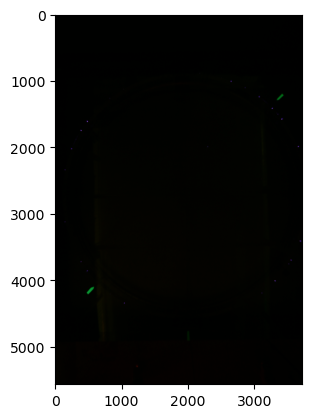

In [79]:
# test_img = test_measurements[1].get_processed_image(test_measurements[1].image_files[7])
test_img = cv2.imread(test_measurements[1].image_files[7], cv2.IMREAD_COLOR)[:,:,::-1]
plt.imshow(test_img)
plt.show()

In [78]:
sigma_min = 1
sigma_max = 16
features_func = partial(skimage.feature.multiscale_basic_features,
                        intensity=True, edges=True, texture=False,
                        sigma_min=sigma_min, sigma_max=sigma_max,
                        channel_axis=-1)

In [80]:
features = features_func(test_img)
features.shape

(5568, 3712, 45)

In [81]:
features = features.reshape((features.shape[0]*features.shape[1], features.shape[2]))

In [85]:
som_shape = (25, 25)
som = MiniSom(*som_shape, features.shape[-1],
              neighborhood_function='gaussian', sigma=som_shape[0]//2)
som.train_random(features, 100000, verbose=True)

 [ 10000 / 10000 ] 100% - 0:00:00 left 

MemoryError: Unable to allocate 96.2 GiB for an array with shape (20668416, 625) and data type float64